# Imports

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import matplotlib.pyplot as plt
import matplotlib.cm as cm
plt.style.use('ggplot')
#plt.style.use('default')

import seaborn as sns

params = {
    'text.color': (0.25, 0.25, 0.25),
    'figure.figsize': [18, 6],
   }

plt.rcParams.update(params)

import pandas as pd
from pandas import json_normalize
pd.options.display.max_rows = 500
pd.options.display.max_seq_items = 500

import geopandas as gpd

import numpy as np
from numpy import percentile
np.random.seed(42)

import copy
import time
from tqdm.notebook import tqdm

from tabulate import tabulate

from scipy import stats
from scipy.stats import skew, kurtosis

In [2]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler, QuantileTransformer, RobustScaler
from sklearn.preprocessing import PolynomialFeatures, PowerTransformer
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.model_selection import train_test_split, cross_val_predict, cross_val_score, cross_validate
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.compose import ColumnTransformer
from sklearn.decomposition import PCA

from sklearn.dummy import DummyRegressor
from sklearn.linear_model import LinearRegression, HuberRegressor, Lasso, LassoCV
from sklearn.linear_model import Ridge, RidgeCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR, SVC
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.inspection import permutation_importance

from sklearn.base import BaseEstimator, TransformerMixin

from sklearn.metrics import mean_squared_error, median_absolute_error
from sklearn.metrics import mean_absolute_percentage_error, mean_absolute_error, r2_score
from sklearn.metrics import make_scorer

import lightgbm as lgb

In [3]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

In [4]:
TITLE_SIZE = 24
TITLE_PADDING = 20

In [5]:
def mape_log_scorer(y_true, y_pred):
    """Calculate Mean Absolute Percentage Error from log transformed target variables"""
    y_true = np.exp(y_true)
    y_pred = np.exp(y_pred)
    return mean_absolute_percentage_error(y_true, y_pred)
    
mape_log = make_scorer(mape_log_scorer, greater_is_better=False)

# 1) EDA
---

## Loading the data & first observations
**Printing the basic stats of the dataframes gets us these insights**:
- The **training data contains 20'313 samples** (aka real estate properties).
- **The test set contains 2'257 properties for which we have to predict the price.**
- We have **19 predicting features** and **one dependent variable** which is – not very surprisingly – named `price`.
- Ignoring `id` there are 13 numerical, three categorical and two geolocation features to predict from.
- At first glance **none of the features seem to have missing values.**
- With just ~6MB memory consumption is low.

In [6]:
df_train = pd.read_csv("_data/houses_train.csv")
df_test = pd.read_csv("_data/houses_test.csv")

df = pd.concat([df_train, df_test]).reset_index(drop=True)

In [7]:
print(f"Training data: {df_train.shape[0]:6,.0f} samples and {df_train.shape[1]:3.0f} features, target included")
print(f"Test data:     {df_test.shape[0]:6,.0f} samples and {df_test.shape[1]:3.0f} features, target not included")

Training data: 20,313 samples and  20 features, target included
Test data:      2,257 samples and  19 features, target not included


In [8]:
display(df.info(memory_usage="deep", verbose=True, show_counts=True))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22570 entries, 0 to 22569
Data columns (total 20 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   id                                        22570 non-null  int64  
 1   lat                                       22570 non-null  float64
 2   long                                      22570 non-null  float64
 3   zipcode                                   22570 non-null  int64  
 4   municipality_name                         22570 non-null  object 
 5   build_year                                22570 non-null  int64  
 6   object_type_name                          22570 non-null  object 
 7   living_area                               22570 non-null  float64
 8   num_rooms                                 22570 non-null  float64
 9   water_percentage_1000                     22570 non-null  float64
 10  travel_time_private_transport     

None

In [9]:
display(pd.concat([df.head(3), df.tail(3)]))

,id,lat,long,zipcode,municipality_name,build_year,object_type_name,living_area,num_rooms,water_percentage_1000,travel_time_private_transport,travel_time_public_transport,number_of_buildings_in_hectare,number_of_apartments_in_hectare,number_of_workplaces_in_hectare,number_of_workplaces_sector_1_in_hectare,number_of_workplaces_sector_2_in_hectare,number_of_workplaces_sector_3_in_hectare,population_in_hectare,price
0,0,47.038963,9.066771,8750,Glarus,1981,Wohnung,134.0,4.0,0.023596,40.0,63.0,26,48.0,7,0,3,6,75,380000.0
1,1,47.097042,8.522013,6318,Walchwil,2018,Wohnung,113.0,3.0,0.249219,33.0,47.0,11,27.0,3,0,3,3,57,1195000.0
2,2,47.429871,7.774141,4434,Hölstein,2007,Mehrfamilienhaus,194.0,5.0,0.007932,22.0,35.0,8,17.0,0,0,0,0,53,880000.0
22567,22567,47.173065,8.518997,6300,Zug,1987,Wohnung,160.0,5.0,0.091670,25.0,27.0,8,67.0,31,0,0,31,116,NaN
22568,22568,47.663849,8.858141,8260,Stein am Rhein,1948,Einfamilienhaus,195.0,6.0,0.136263,38.0,63.0,10,13.0,3,3,0,0,20,NaN
22569,22569,46.892609,9.844902,7249,Klosters-Serneus,1900,Einfamilienhaus,100.0,4.0,0.010686,85.0,112.0,2,4.0,0,0,0,0,6,NaN


In [10]:
display(df.sample(3, random_state=42).T)

,6325,10133,5871
id,6325,10133,5871
lat,46.984631,47.513287,47.497444
long,6.869262,7.768124,7.619514
zipcode,2035,4422,4144
municipality_name,Corcelles-Cormondrèche,Arisdorf,Arlesheim
build_year,1907,1972,1900
object_type_name,Einfamilienhaus,Einfamilienhaus,Einfamilienhaus
living_area,150.0,203.0,191.0
num_rooms,7.0,7.0,7.5
water_percentage_1000,0.000636,0.0,0.000714


We get this additional information about the data set: 

- `id` – id der Liegeschaft
- `lat` – Latitude
- `long` – Longitude
- `zipcode` – Postleitzahl
- `municipality_name` – Ortschaft
- `build_year` – Baujahr
- `object_type_name` – Liegenschafttyp (Wohnung, Sonstiges, Einfamilienhaus, Mehrfamilienhaus)
- `living_area` – Wohnfläche
- `num_rooms` – Anzahl Zimmer
- `water_percentage_1000` – Anteil an Gewässer in 1 km Umkreis
- `travel_time_private_transport` – Reisezeit zum Zentrum mit dem privaten Verkehr
- `travel_time_public_transport` – Reisezeit zum Zentrum mit dem öffentlichen Verkehr
- `number_of_buildings_in_hectare` – Anzahl Gebäude innerhalb der Hektare
- `number_of_apartments_in_hectare` – Anzahl Wohnungen innerhalb der Hektare
- `number_of_workplaces_in_hectare` – Anzahl Arbeitsplätze innerhalb der Hektare
- `number_of_workplaces_sector_1_in_hectare` – Anzahl Arbeitsplätze des Sektor 1 innerhalb der Hektare
- `number_of_workplaces_sector_2_in_hectare` – Anzahl Arbeitsplätze des Sektor 2 innerhalb der Hektare
- `number_of_workplaces_sector_3_in_hectare` – Anzahl Arbeitsplätze des Sektor 3 innerhalb der Hektare
- `population_in_hectare` – Bevölkerungsanzahl innerhalb der Hektare
- `price` – Preis der Liegenschaft

Quick reminder to self:

- A «hektar» equals 10'000 square meters. 
- «Sektor 1» is the economic «Primärsektor» aka the extraction of raw materials and agriculture. «Sektor 2» is manufacturing, «Sektor 3» is the service industry.

**What we do not know:**
- We have no information how the data set was collected or put together.
- We neither know the time frame in which the sales took place. 
- In the Kanton Zurich alone more than [7'000 properties are sold per year](https://www.zh.ch/de/planen-bauen/raumplanung/immobilienmarkt.html). From [various sources](https://www.sred.ch/produkte-und-preise/basisprodukt-kunden/) I gather that there are at least 50k real private real estate sales («Freihandverkäufe») per year in Switzerland. So it is possible (but not given in any way) that our data contains sales from a smaller time frame, e.g., from one year. 

## Missing values

**We don't have missing values in the data.**

In [11]:
print(f"The count of missing values is {df.drop('price', axis=1).isna().sum().sum()}")
print()
display(df.drop("price", axis=1).isna().sum())

The count of missing values is 0



id                                          0
lat                                         0
long                                        0
zipcode                                     0
municipality_name                           0
build_year                                  0
object_type_name                            0
living_area                                 0
num_rooms                                   0
water_percentage_1000                       0
travel_time_private_transport               0
travel_time_public_transport                0
number_of_buildings_in_hectare              0
number_of_apartments_in_hectare             0
number_of_workplaces_in_hectare             0
number_of_workplaces_sector_1_in_hectare    0
number_of_workplaces_sector_2_in_hectare    0
number_of_workplaces_sector_3_in_hectare    0
population_in_hectare                       0
dtype: int64

## Duplicates

**We do not have exact duplicates in our data. All IDs and locations are unique too.**

In [12]:
print(f"There are {df.drop(['price'], axis=1).duplicated().sum()} exact duplicates in the data set.")

There are 0 exact duplicates in the data set.


In [13]:
# Sanity check if all IDs are unique 
assert df.id.nunique() == len(df)

In [14]:
# Sanity check if all locations are unique
cols = ["lat", "long"]
assert df[cols].duplicated().sum() == 0

There are 47 zip codes and 27 municipalities in the test data that aren't present in the test set. We have to keep that in mind when we encode the categoricals.

In [15]:
zip_train = set(df_train.zipcode.values)
zip_test = set(df_test.zipcode.values)
mun_train = set(df_train.municipality_name.values)
mun_test = set(df_test.municipality_name.values)
print(f"We have {len([x for x in zip_test if x not in zip_train])} zip codes in the test data that aren't in the train set.")
print(f"We have {len([x for x in mun_test if x not in mun_train])} municipalities in the test data that aren't in the train set.")

We have 47 zip codes in the test data that aren't in the train set.
We have 27 municipalities in the test data that aren't in the train set.


## Examining the features

### Value counts
Printing value counts for each feature reveals:
- The properties come from a wide variety of places in Switzerland.
- Several values for `build_year` are erroneous (e.g. 1, 18, 19, 1019, 2022, 2049, 2106, 2108).
- There are 90 properties with 0 rooms. These might be missing values (*«number of rooms not known to data collector»*) that already have been filled. We need to check what kind of properties these are.
- For 713 properties there the registered population in the «hektar» is 0. Need to check that too.

In [16]:
# for feature in df.drop("id", axis=1):
#     print("-"*80)
#     print(feature, "|", df[feature].dtype)
#     print(df[feature].value_counts(dropna=False).sort_index())
#     print()

Looking at the samples where `num_rooms` is 0 I see that many of these are regular properties where there has to be rooms. I assume that value 0 here indicates missing information.

In [36]:
display(df[df.num_rooms==0].head(10))
display(df[df.num_rooms==0].object_type_name.value_counts())

,id,lat,long,zipcode,municipality_name,build_year,object_type_name,living_area,num_rooms,water_percentage_1000,...,travel_time_public_transport,number_of_buildings_in_hectare,number_of_apartments_in_hectare,number_of_workplaces_in_hectare,number_of_workplaces_sector_1_in_hectare,number_of_workplaces_sector_2_in_hectare,number_of_workplaces_sector_3_in_hectare,population_in_hectare,price,geometry
409,409,47.598782,8.507547,8196,Wil (ZH),1987,Einfamilienhaus,269.0,0.0,0.008695,...,39.0,1,1.0,0,0,0,0,6,2900000.0,POINT (8.50755 47.59878)
470,470,46.606796,7.374643,3766,Boltigen,1910,Sonstiges,124.0,0.0,0.006892,...,73.0,5,7.0,3,0,0,3,12,290000.0,POINT (7.37464 46.60680)
488,488,47.171837,7.568303,4563,Gerlafingen,2016,Sonstiges,239.0,0.0,0.080827,...,47.0,3,6.0,10,0,3,7,14,658000.0,POINT (7.56830 47.17184)
544,544,47.007801,7.718512,3452,Lützelflüh,1971,Einfamilienhaus,253.0,0.0,0.009109,...,44.0,2,3.0,0,0,0,0,3,970000.0,POINT (7.71851 47.00780)
630,630,46.176735,6.872444,1874,Champéry,2016,Wohnung,50.0,0.0,0.009045,...,99.0,4,11.0,3,0,0,3,5,430000.0,POINT (6.87244 46.17673)
837,837,47.257164,8.853316,8630,Rüti (ZH),1988,Sonstiges,121.0,0.0,0.013088,...,25.0,8,48.0,3,0,0,3,102,725000.0,POINT (8.85332 47.25716)
1000,1000,47.436878,8.853040,8488,Turbenthal,2017,Wohnung,141.0,0.0,0.007488,...,49.0,8,9.0,3,0,0,3,22,986000.0,POINT (8.85304 47.43688)
1010,1010,47.545975,8.912608,8500,Frauenfeld,1996,Wohnung,126.0,0.0,0.005050,...,34.0,7,26.0,3,0,0,3,47,660000.0,POINT (8.91261 47.54597)
1098,1098,47.250526,8.597260,8810,Horgen,1998,Sonstiges,228.0,0.0,0.012834,...,12.0,3,20.0,3,0,0,3,33,2280000.0,POINT (8.59726 47.25053)
1204,1204,46.134884,7.932935,3910,Saas-Grund,1989,Einfamilienhaus,226.0,0.0,0.000000,...,101.0,4,13.0,3,3,0,3,13,850000.0,POINT (7.93294 46.13488)


Einfamilienhaus     46
Sonstiges           21
Wohnung             21
Mehrfamilienhaus     2
Name: object_type_name, dtype: int64

Checking the properties where `population_in_hectare` is 0 I see that again this seems to represent missing values. E.g., if a property is an apartment there have to be other tenants around.

In [18]:
display(df[df.population_in_hectare==0])
display(df[df.population_in_hectare==0].object_type_name.value_counts())

,id,lat,long,zipcode,municipality_name,build_year,object_type_name,living_area,num_rooms,water_percentage_1000,travel_time_private_transport,travel_time_public_transport,number_of_buildings_in_hectare,number_of_apartments_in_hectare,number_of_workplaces_in_hectare,number_of_workplaces_sector_1_in_hectare,number_of_workplaces_sector_2_in_hectare,number_of_workplaces_sector_3_in_hectare,population_in_hectare,price
20,20,46.592037,7.069014,1661,Le Pâquier (FR),2016,Wohnung,79.0,3.5,0.006653,37.0,81.0,1,1.0,0,0,0,0,0,513000.0
35,35,46.176670,7.272174,1997,Nendaz,2016,Einfamilienhaus,164.0,7.0,0.000000,67.0,105.0,4,4.0,0,0,0,0,0,1095000.0
69,69,46.759586,8.157655,6078,Lungern,2019,Wohnung,117.0,4.0,0.000000,56.0,103.0,0,0.0,0,0,0,0,0,690000.0
127,127,46.723053,8.040057,3855,Brienz (BE),2012,Einfamilienhaus,80.0,3.0,0.000054,47.0,84.0,20,27.0,0,0,0,0,0,668000.0
137,137,47.092102,8.367200,6036,Dierikon,1975,Wohnung,165.0,5.5,0.003562,28.0,50.0,0,0.0,0,0,0,0,0,920000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22410,22410,46.004974,8.960302,6900,Lugano,2015,Wohnung,135.0,4.0,0.363855,0.0,0.0,0,0.0,6,0,0,6,0,NaN
22443,22443,45.952068,9.005564,6822,Arogno,1985,Einfamilienhaus,155.0,4.0,0.000000,16.0,29.0,0,0.0,0,0,0,0,0,NaN
22514,22514,46.519722,6.477249,1134,Chigny,2010,Sonstiges,212.0,5.5,0.000584,17.0,20.0,0,0.0,0,0,0,0,0,NaN
22532,22532,46.754814,7.684699,3625,Heiligenschwendi,1980,Einfamilienhaus,58.0,2.0,0.000000,26.0,52.0,0,0.0,0,0,0,0,0,NaN


Einfamilienhaus     295
Wohnung             276
Sonstiges           107
Mehrfamilienhaus     35
Name: object_type_name, dtype: int64

### Numerical features
Plotting the numerical features we can see:
- **None of the features are normally distributed.**
- **All features have outliers**. 
- The distribution of **our dependent variable `price` is skewed as well** and has **a substantial amount of outliers.** 


In [19]:
numerical = ['build_year','living_area', 'num_rooms', 'water_percentage_1000',
           'travel_time_private_transport', 'travel_time_public_transport',
           'number_of_buildings_in_hectare', 'number_of_apartments_in_hectare',
           'number_of_workplaces_in_hectare', 'number_of_workplaces_sector_1_in_hectare',
           'number_of_workplaces_sector_2_in_hectare', 'number_of_workplaces_sector_3_in_hectare', 
           'population_in_hectare', 'price'
            ]

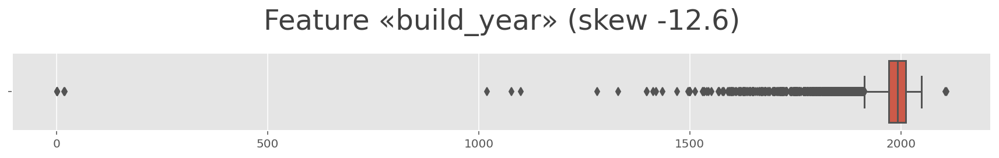

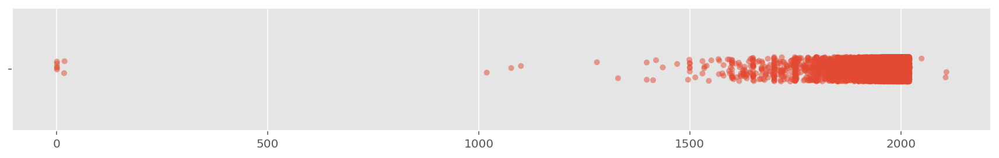

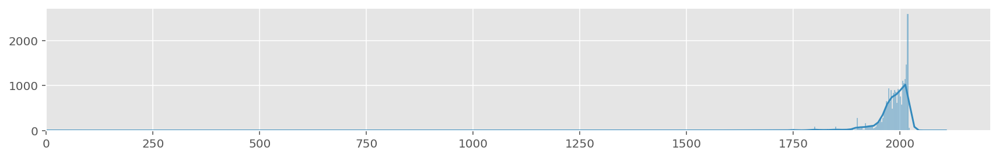

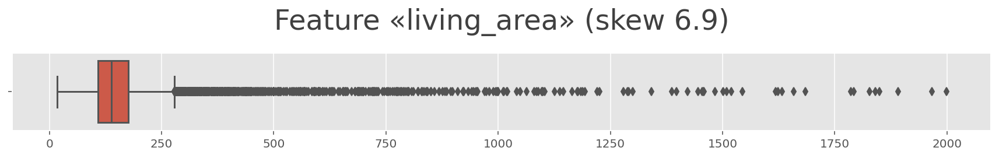

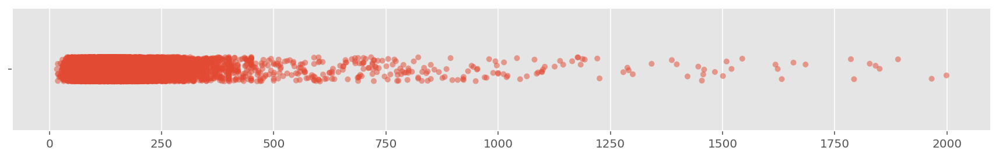

...

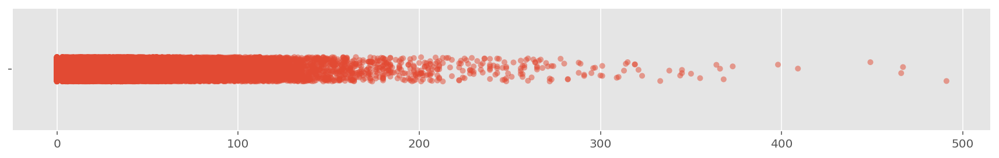

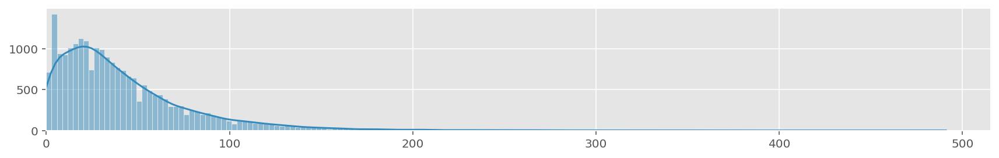

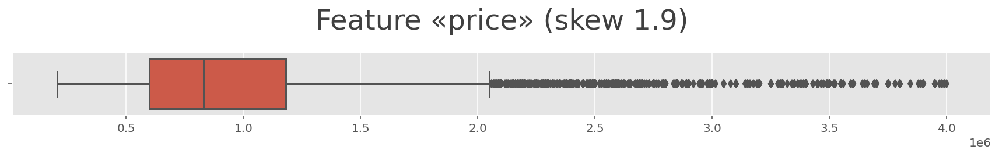

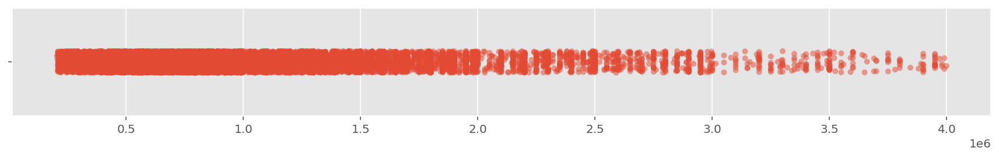

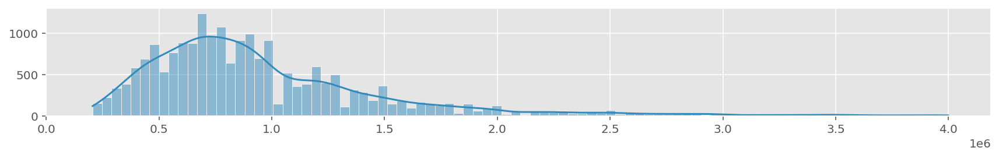

In [20]:
figsize = (12,2)

for num in df[numerical]:

    plt.figure(figsize=figsize)
    sns.boxplot(data=df, x=num)
    skew_ = df[num].skew()
    plt.title(f"Feature «{num}» (skew {skew_:.1f})", size=TITLE_SIZE, pad=TITLE_PADDING)
    plt.xlabel("")
    plt.tight_layout()
    plt.show()
    
    plt.figure(figsize=figsize)
    sns.stripplot(data=df, x=num, alpha=.5)
    plt.xlabel("")
    plt.tight_layout()
    plt.show()
    
    plt.figure(figsize=figsize)
    sns.histplot(data=df, x=num, kde=True)
    plt.ylabel("")
    plt.xlabel("")
    plt.xlim(0, None)
    plt.tight_layout()
    plt.show()
    
    print("\n\n")

**Is there any structure in the data *«along»* the samples aka along axis `id`?** Is there **any obvious difference in the data distribution between train and test set?**
- Though we see again the skewed distributions and outliers there is no obvious structure visible along the axis of IDs. 
- It seems the data is properly shuffled and the test set is a representative sample to predict on.

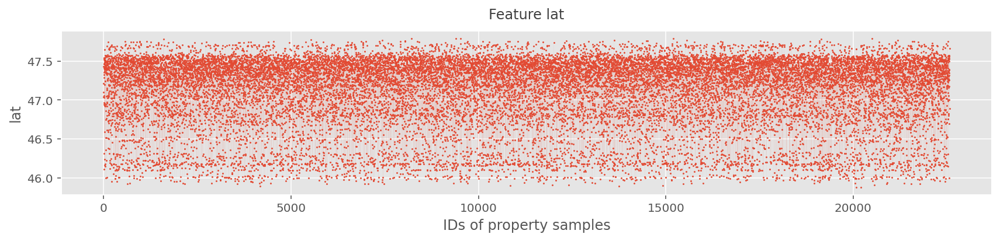

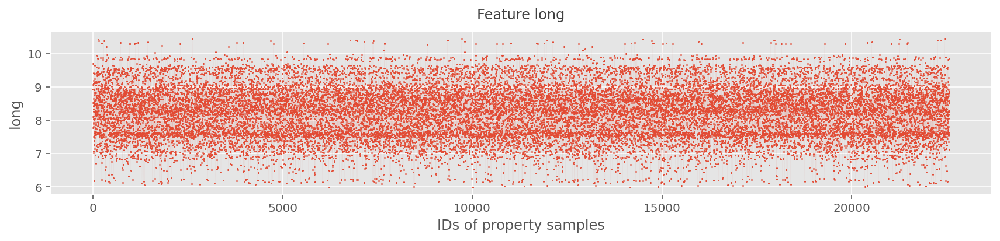

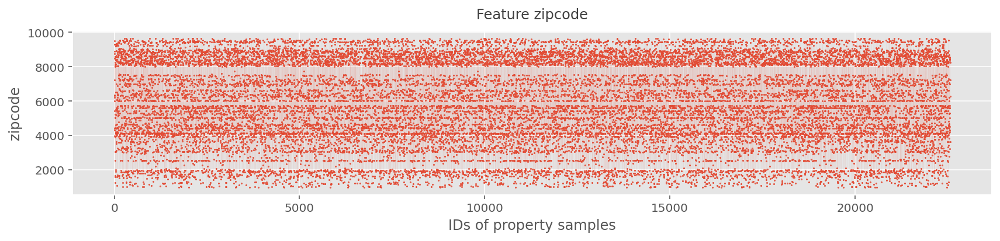

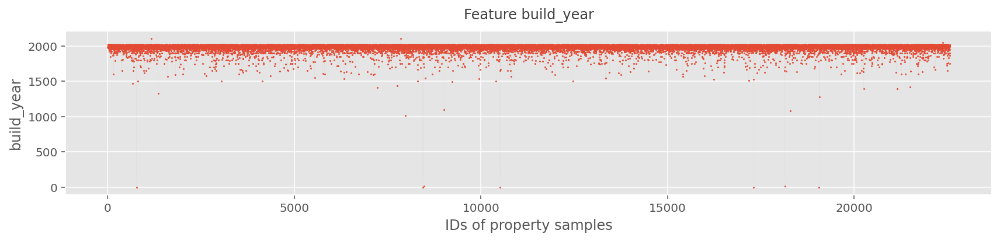

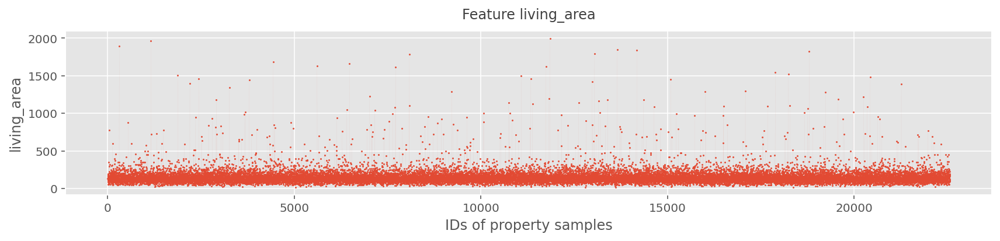

...

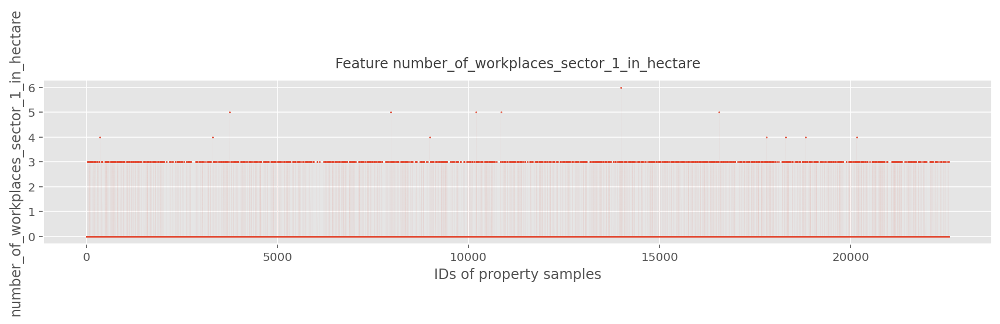

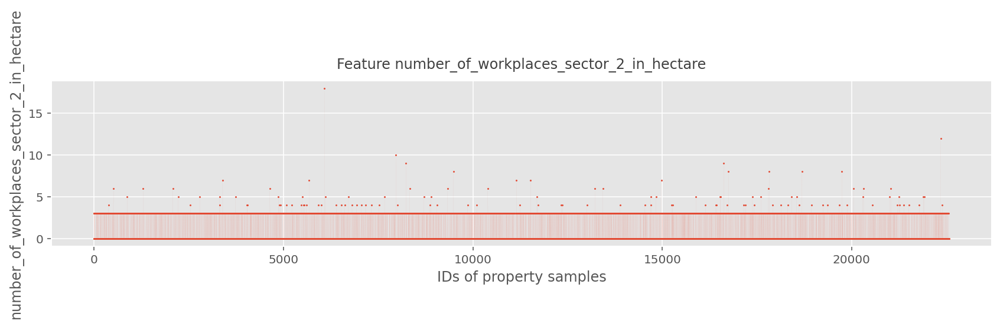

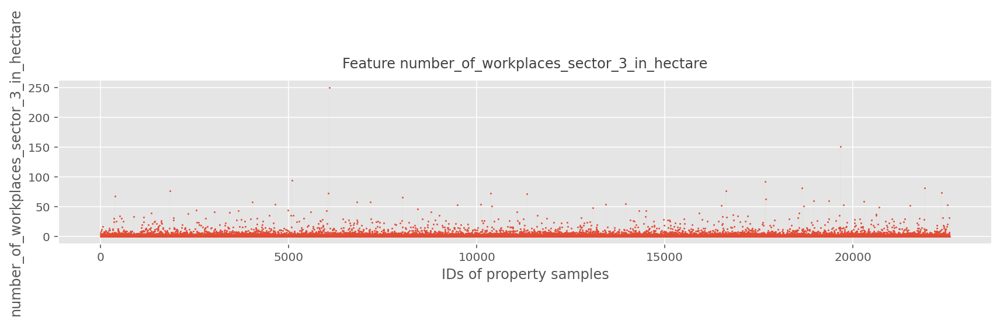

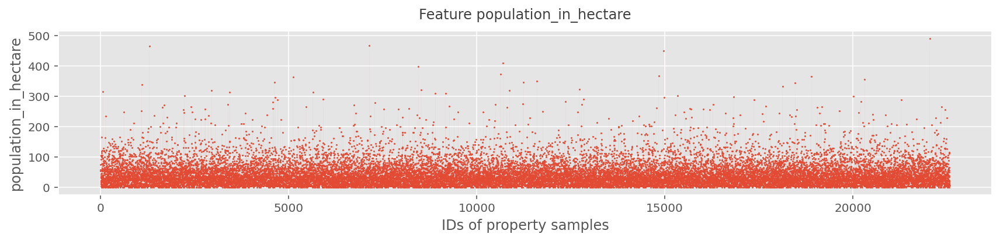

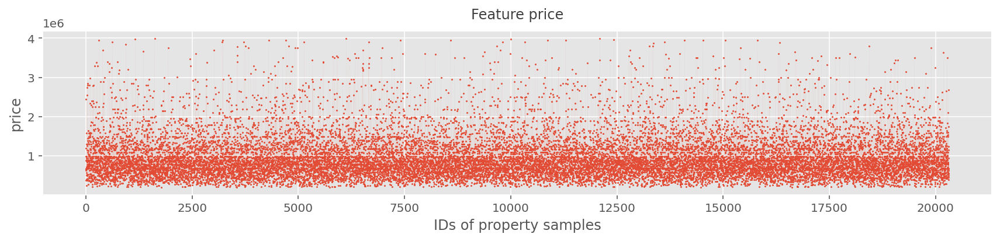

In [21]:
for col in df.select_dtypes("number").columns[1:]:
    plt.figure(figsize=(12,3))
    df[col].plot(lw=.01, marker='.', markersize=1)
    plt.title(f"Feature {col}", size=12, pad=10)
    # plt.xticks([])
    plt.xlabel("IDs of property samples")
    plt.ylabel(f"{col}")
    # plt.legend(["female", "male"], markerscale=12, loc="lower right")
    plt.tight_layout()
    plt.show()

### Correlations between numerical features

- **Price only has a weak to moderate linear correlation to living area and room count.**
- The geographical features correlate strongly among each other, which is to be expected. 
- Population and housing density correlate with each other. That makes sense too.

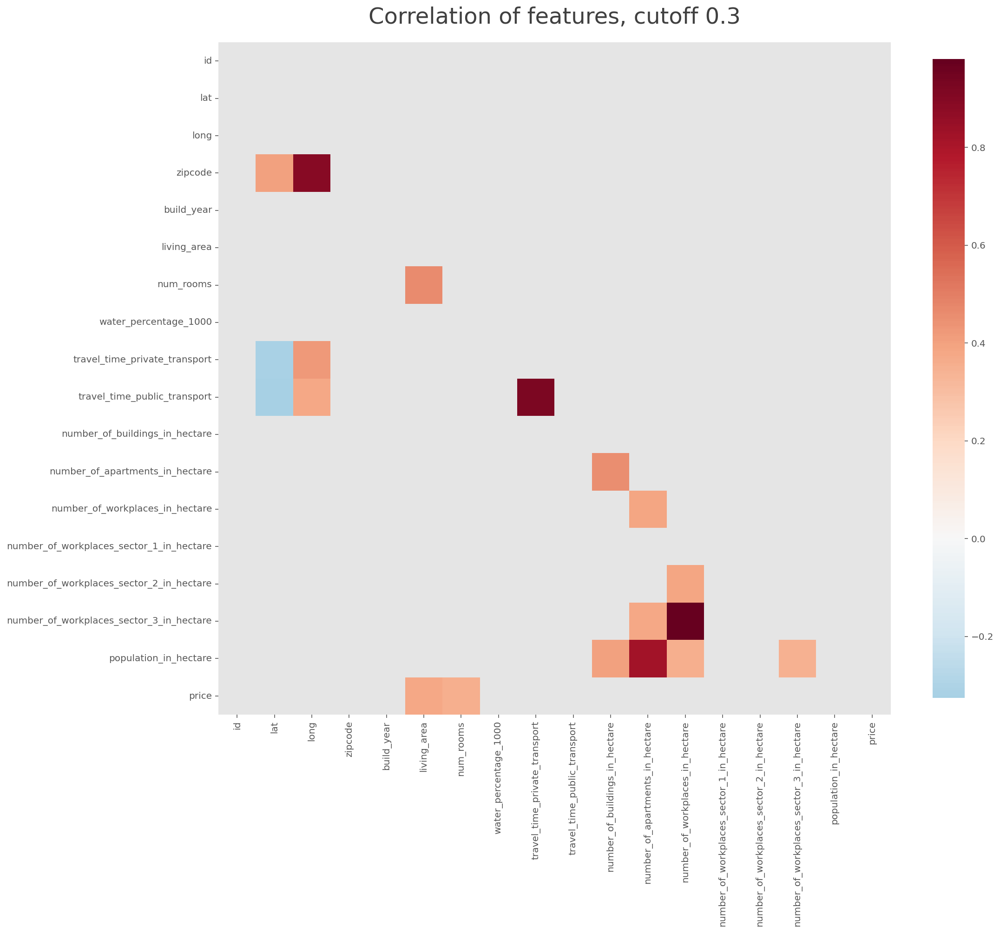

In [22]:
# set threshold to cut off weak correlations
correlation_treshold = 0.3

corr = df.corr()
corr_cutoff = corr[(corr > correlation_treshold) | (corr < -correlation_treshold)]

plt.figure(figsize=(16,16))
sns.heatmap(corr_cutoff, 
            cmap="RdBu_r", 
            # https://stackoverflow.com/questions/57414771/how-to-plot-only-the-lower-triangle-of-a-seaborn-heatmap
            mask=np.triu(corr_cutoff),
            center=0,
            square=True, 
            annot=False, 
            cbar_kws={"shrink": .7},
           )
plt.title(f"Correlation of features, cutoff {correlation_treshold}", size=TITLE_SIZE, pad=TITLE_PADDING)
plt.tight_layout()
plt.show()

### Outliers

A simple outlier analysis by IQR range reveals:
- Even with a wide IQR cutoff of 3 we can identify several thousands of outliers in the raw data.
- Log transforming the features substantially reduces the outlier count. 
- In order to not loose to much data **I decide to remove outliers only based on the log transformed data and only for the highly correlated features `num_rooms` and `living_area`.**

In [23]:
def get_outliers(data, iqr_multiple=3, log_data=False):
    results = []
    for col in data[numerical].columns:
        if log_data==True:
            q25 = percentile(np.log1p(data[col]), 25)
            q75 = percentile(np.log1p(data[col]), 75)
            iqr = q75 - q25
            upper = q75 + iqr * iqr_multiple
            to_drop = data[np.log1p(data[col]) > upper].index
        else:
            q25 = percentile(data[col], 25)
            q75 = percentile(data[col], 75)
            iqr = q75 - q25
            upper = q75 + iqr * 3
            to_drop = data[data[col] > upper].index 
        if len(to_drop)>0:
            results.append((col, len(to_drop)))
    return pd.DataFrame(results, columns=["feature", "outlier_count"]).sort_values("outlier_count", ascending=False).reset_index(drop=True)

In [24]:
display(get_outliers(df_train))
display(get_outliers(df_train, log_data=True))

,feature,outlier_count
0,number_of_workplaces_sector_2_in_hectare,4800
1,water_percentage_1000,1998
2,number_of_workplaces_sector_1_in_hectare,1126
3,number_of_workplaces_in_hectare,470
4,number_of_workplaces_sector_3_in_hectare,404
5,living_area,376
6,price,240
7,population_in_hectare,217
8,travel_time_private_transport,146
9,number_of_apartments_in_hectare,130


,feature,outlier_count
0,number_of_workplaces_sector_2_in_hectare,4800
1,water_percentage_1000,1949
2,number_of_workplaces_sector_1_in_hectare,1126
3,living_area,110
4,num_rooms,19
5,number_of_workplaces_in_hectare,1


### Geographical coordinates

By mapping all lat/long values to a base map of Switzerland we see: 
- The mayority of the properties are located in the north eastern part.
- There are some noticable hot spots in Wallis (likely Bagnes), the Tessin and Graubünden (e.g. Davos). I assume these are mainly holiday properties.

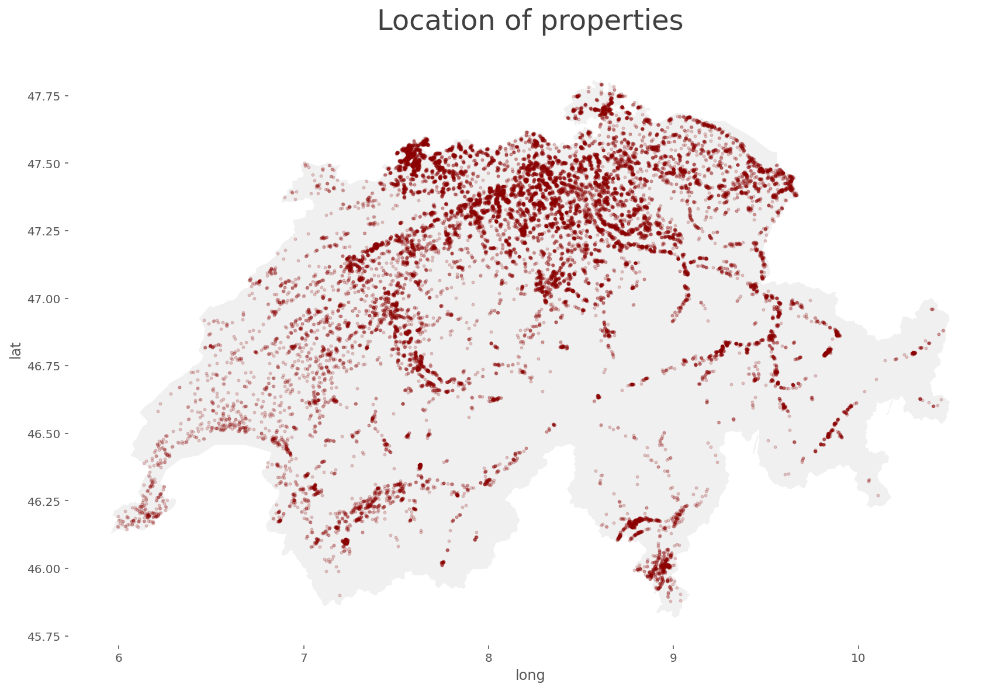

In [25]:
crs = {'init':'EPSG:4326'}

gdf = gpd.GeoDataFrame(df, crs=crs, geometry=gpd.points_from_xy(df.long, df.lat))
swiss_map = gpd.read_file('_data/_geodata/CHE_adm0.shp')

fig, ax = plt.subplots(figsize=(12, 9))
ax.patch.set_facecolor('white')

swiss_map.plot(ax=ax, color="#F0F0F0")

gdf.plot(ax=ax, alpha=.2, markersize=6, color="darkred")

plt.title("Location of properties", size=TITLE_SIZE, pad=TITLE_PADDING)
plt.xlabel("long")
plt.ylabel("lat")
plt.tight_layout()
plt.show()

Coloring and sizing by price does not reveal a clear pattern. 
- The holiday areas stick out though. 
- The many (expensive) properties in Basel are noticable too.

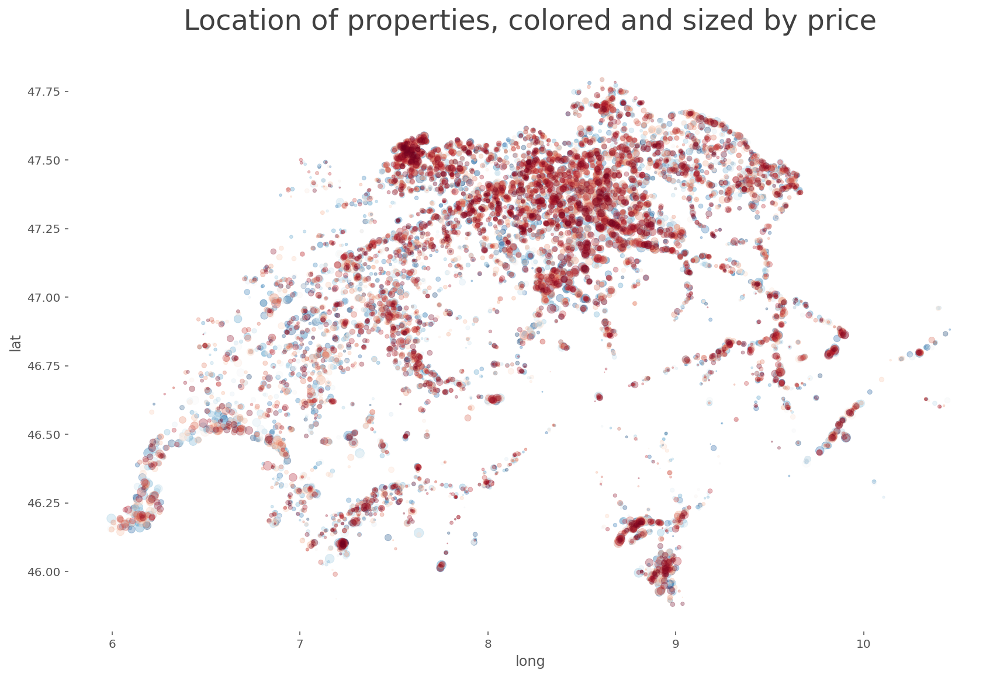

In [26]:
gdf = gpd.GeoDataFrame(df_train, crs=crs, geometry=gpd.points_from_xy(df_train.long, df_train.lat))

fig, ax = plt.subplots(figsize=(12, 9))
ax.patch.set_facecolor('white')

price_scaled = np.log1p((df_train.price - df_train.price.min())/ df_train.price.max())*100
gdf.plot(ax=ax, alpha=.3, markersize=price_scaled, c=df_train.price, cmap='RdBu_r')

plt.title("Location of properties, colored and sized by price", size=TITLE_SIZE, pad=TITLE_PADDING)
plt.xlabel("long")
plt.ylabel("lat")
plt.tight_layout()
plt.show()

**Comparing the locations of the train and the test data I do not notice any obvious differences.**

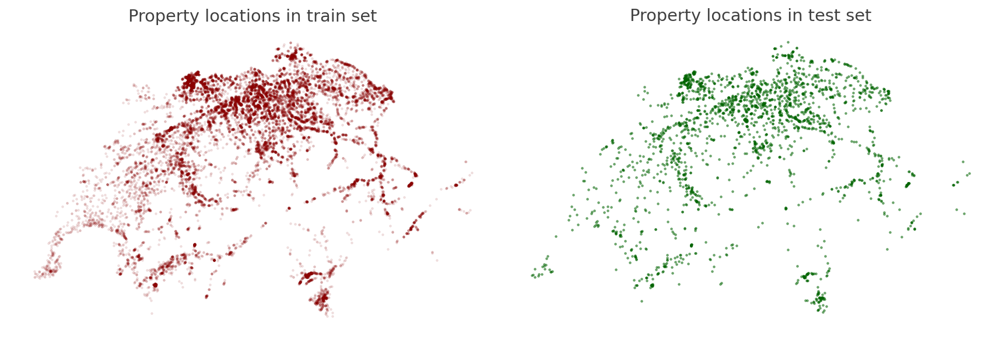

In [27]:
gdf_train = gpd.GeoDataFrame(df_train, crs=crs, geometry=gpd.points_from_xy(df_train.long, df_train.lat))
gdf_test = gpd.GeoDataFrame(df_test, crs=crs, geometry=gpd.points_from_xy(df_test.long, df_test.lat))

fig, ax = plt.subplots(figsize=(12, 9), ncols=2, sharey=True)

for idx in range(0,2):
    ax[idx].patch.set_facecolor('white')
    ax[idx].set_xticks([])
    ax[idx].set_yticks([])
    ax[idx].set_xlabel("")

gdf_train.plot(ax=ax[0], alpha=.1, markersize=3, color="darkred")
gdf_test.plot(ax=ax[1], alpha=.5, markersize=3, color="darkgreen")

ax[0].set_title("Property locations in train set")
ax[1].set_title("Property locations in test set")

plt.tight_layout()
plt.show()

### Categorical features

#### Municipalities
- From plotting the top 50 **municipalities** we can observe that **the locations aren't equally distributed**. E.g., Bagnes and Davos rank higher than the size of the municipality would suggest. Again I assume these are mainly holiday properties and for unknown reasons are overweighed in the data.
- The distribution of the property counts is skewed as well. This is to be expected since the municipalities overall are very different in size, population and housing density.

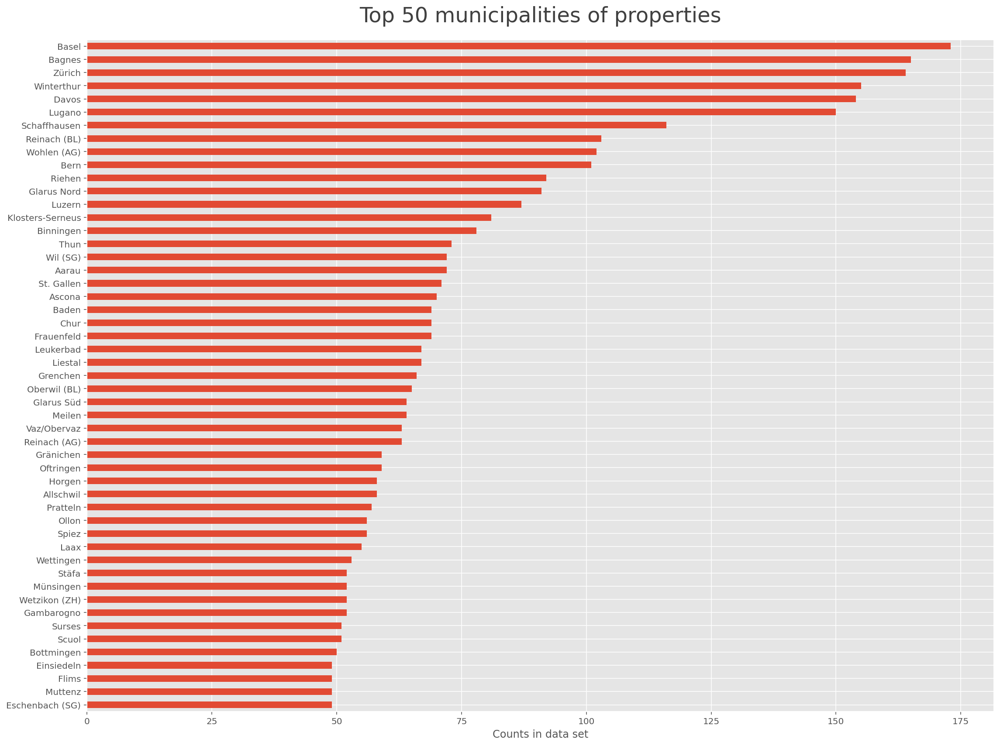

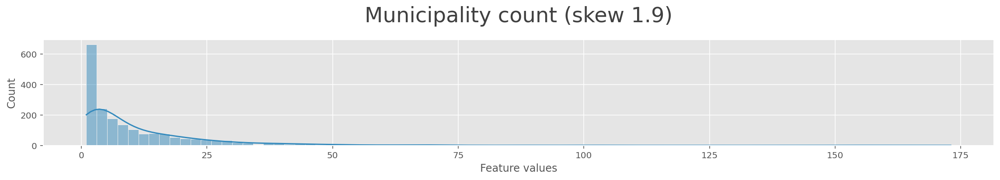

In [28]:
top_n = 50
df_top = df.municipality_name.value_counts().sort_values(ascending=False)
df_top.iloc[-(len(df_top)-top_n)::-1].plot.barh(figsize=(16,12))
plt.title(f"Top {top_n} municipalities of properties", size=TITLE_SIZE, pad=TITLE_PADDING)
plt.xlabel("Counts in data set")
plt.tight_layout()
plt.show()

plt.figure(figsize=(16,3))
sns.histplot(data=df_top, kde=True)
skew_ = df[num].skew()
plt.title(f"Municipality count (skew {skew_:.1f})", size=TITLE_SIZE, pad=TITLE_PADDING)
plt.xlabel("Feature values")
plt.tight_layout()
plt.show()

#### Object type
- We mainly have apartments and single family houses in the data set. 

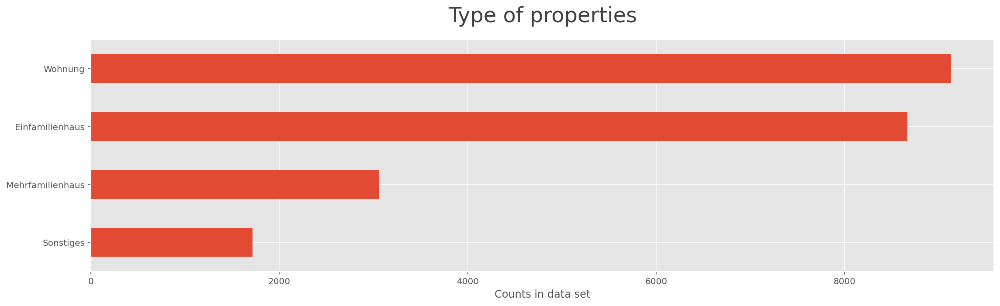

In [29]:
df_top = df.object_type_name.value_counts().sort_values(ascending=False)
df_top.iloc[::-1].plot.barh(figsize=(16,5))
plt.title(f"Type of properties", size=TITLE_SIZE, pad=TITLE_PADDING)
plt.xlabel("Counts in data set")
plt.tight_layout()
plt.show()

**What are the objects of type «Sonstiges»?** 
- By manually checking objects of this category in Google Maps by their coordinates I find regular (apartment) houses. 
- The label «Sonstiges» therefore likely signifies an unknown type that hasn't been specified but falls in the category of apartment or house.

In [30]:
display(df[df.object_type_name=="Sonstiges"].head(10))

,id,lat,long,zipcode,municipality_name,build_year,object_type_name,living_area,num_rooms,water_percentage_1000,...,travel_time_public_transport,number_of_buildings_in_hectare,number_of_apartments_in_hectare,number_of_workplaces_in_hectare,number_of_workplaces_sector_1_in_hectare,number_of_workplaces_sector_2_in_hectare,number_of_workplaces_sector_3_in_hectare,population_in_hectare,price,geometry
17,17,46.113590,7.932807,3906,Saas-Fee,1984,Sonstiges,58.0,3.5,0.000224,...,107.0,15,34.0,0,0,0,0,11,415000.0,POINT (7.93281 46.11359)
30,30,47.411411,8.270765,5507,Mellingen,1996,Sonstiges,120.0,5.0,0.034769,...,45.0,9,72.0,3,0,0,3,165,499000.0,POINT (8.27077 47.41141)
55,55,47.446285,7.735746,4416,Bubendorf,1994,Sonstiges,140.0,4.0,0.005708,...,28.0,16,52.0,3,0,0,3,95,770000.0,POINT (7.73575 47.44629)
62,62,47.482006,8.285507,5400,Baden,1988,Sonstiges,126.0,4.5,0.037909,...,16.0,28,29.0,6,0,3,5,93,790000.0,POINT (8.28551 47.48201)
88,88,47.132931,8.137594,6207,Nottwil,1950,Sonstiges,160.0,7.0,0.154619,...,61.0,4,13.0,8,3,3,5,24,890000.0,POINT (8.13759 47.13293)
117,117,46.381065,7.626465,3954,Leukerbad,2002,Sonstiges,310.0,11.0,0.000000,...,124.0,17,74.0,4,3,3,3,27,1100000.0,POINT (7.62647 46.38107)
129,129,46.503624,8.949182,6719,Blenio,1864,Sonstiges,600.0,20.0,0.000000,...,94.0,20,22.0,3,0,0,3,23,440000.0,POINT (8.94918 46.50362)
152,152,46.740768,7.616101,3604,Thun,1980,Sonstiges,159.0,6.5,0.001250,...,24.0,14,34.0,3,0,0,3,76,985000.0,POINT (7.61610 46.74077)
169,169,46.121895,8.791286,6576,Gambarogno,1989,Sonstiges,130.0,5.5,0.222403,...,65.0,9,18.0,3,0,3,0,11,875000.0,POINT (8.79129 46.12189)
170,170,46.621845,8.043109,3818,Grindelwald,2016,Sonstiges,210.0,5.5,0.004597,...,98.0,1,2.0,0,0,0,0,3,2790000.0,POINT (8.04311 46.62185)


From mapping all properties labeled «Sonstiges» I can not observe any meaningful differences.

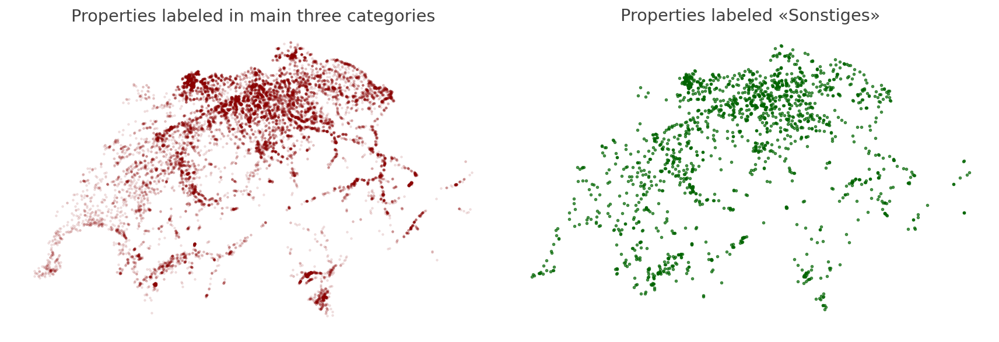

In [31]:
df_other = df[df.object_type_name=="Sonstiges"]
df_main = df.drop(df_other.index)

gdf_main = gpd.GeoDataFrame(df_main, crs=crs, geometry=gpd.points_from_xy(df_main.long, df_main.lat))
gdf_other = gpd.GeoDataFrame(df_other, crs=crs, geometry=gpd.points_from_xy(df_other.long, df_other.lat))

fig, ax = plt.subplots(figsize=(12, 9), ncols=2, sharey=True)

for idx in range(0,2):
    ax[idx].patch.set_facecolor('white')
    ax[idx].set_xticks([])
    ax[idx].set_yticks([])
    ax[idx].set_xlabel("")

gdf_main.plot(ax=ax[0], alpha=.1, markersize=3, color="darkred")
gdf_other.plot(ax=ax[1], alpha=.7, markersize=5, color="darkgreen")

ax[0].set_title("Properties labeled in main three categories")
ax[1].set_title("Properties labeled «Sonstiges»")

plt.tight_layout()
plt.show()

## Examining the target variable `price`

- **Prices range from 205'000 to 3'999'000** (most likely CHF).
- The **median is 830k**, the **average is ~961k** (affected by the outliers).
- Prices differ on average by ~534k CHF around the average (standard deviation).
- We already have seen the very skewed value distribution of sale prices. 
- **Log transforming seems to work good** on the data and likely will help to make more precise predictions.

In [32]:
print(df.price.describe().astype(int))

count      20313
mean      961475
std       543853
min       205000
25%       600000
50%       830000
75%      1180000
max      3999000
Name: price, dtype: int64


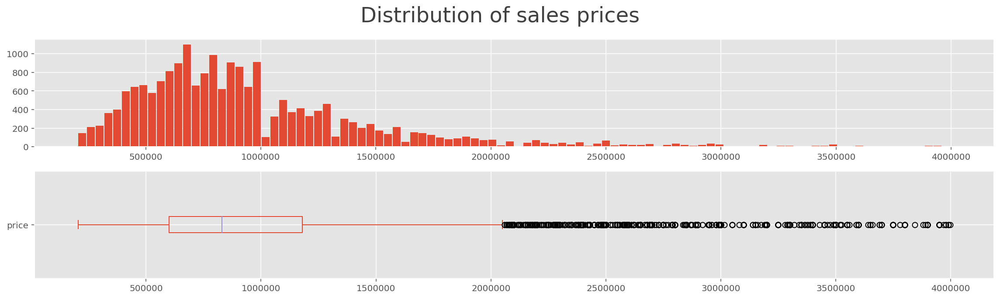

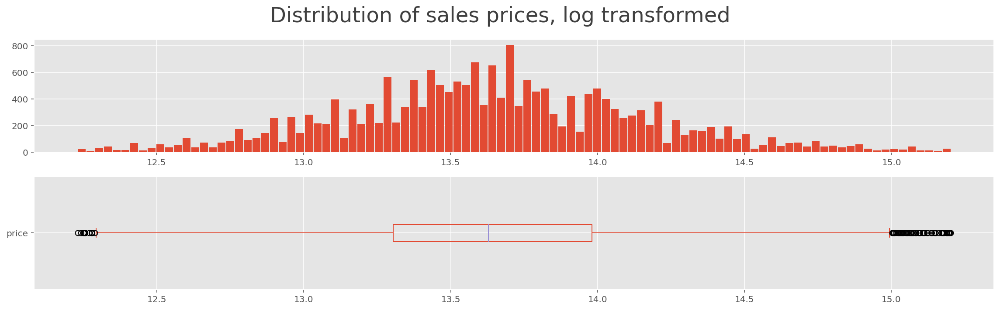

In [33]:
plt.suptitle("Distribution of sales prices", size=24)
plt.subplot(2,1,1)
df.price.plot(kind="hist", bins=100, rwidth=.9, figsize=(16,5))
plt.ylabel("")
plt.ticklabel_format(axis='x', style='plain')
plt.subplot(2,1,2)
df.price.plot(kind="box", vert=False)
plt.tight_layout()
plt.ticklabel_format(axis='x', style='plain')
plt.show()

plt.suptitle("Distribution of sales prices, log transformed", size=24)
plt.subplot(2,1,1)
np.log(df.price).plot(kind="hist", bins=100, rwidth=.9, figsize=(16,5))
plt.ylabel("")
plt.subplot(2,1,2)
np.log(df.price).plot(kind="box", vert=False)
plt.tight_layout()
plt.show()

### Correlations of features to target variable

- Living area and number of rooms are the only two features with a significant linear correlation to the target variable. 
- Among the other even less correlated features the proximity to water sticks out. Some properties might be close to lakes or have a waterfront to a river and therefore are more expensive. 
- Travel time to the next city center sticks out as negatively correlated. That makes sense – the shorter the travel time the closer the property is to the center and therefore it is likely to be more expensive.

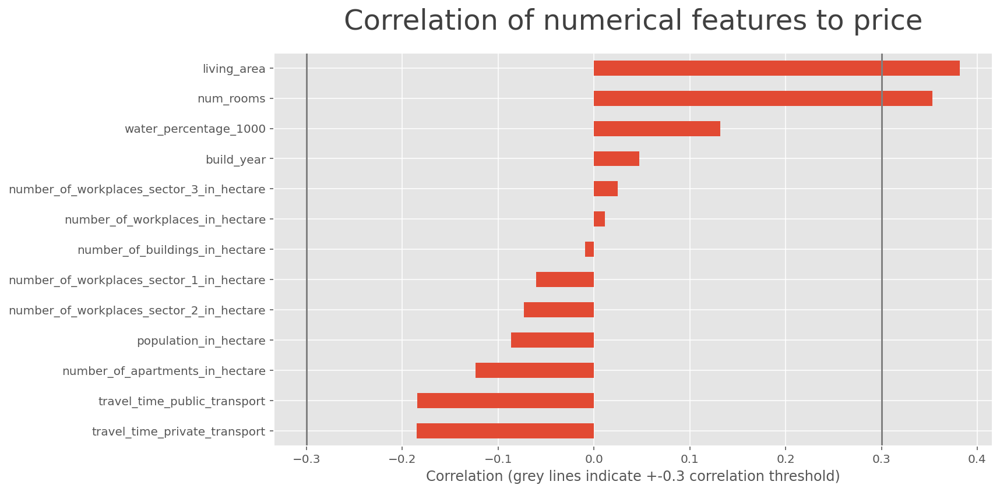

In [34]:
corr = df.drop(["id", "lat", "long", "zipcode"], axis=1).corr()

corr["price"].sort_values(ascending=True)[:-1].plot.barh(figsize=(12,6))
plt.title(f"Correlation of numerical features to price", size=TITLE_SIZE, pad=TITLE_PADDING)
plt.axvline(-correlation_treshold, color="grey")
plt.axvline(correlation_treshold, color="grey")
plt.xlabel(f"Correlation (grey lines indicate +-{correlation_treshold} correlation threshold)")
plt.tight_layout()
plt.show()

By **plotting price against to two most correlated features** we observe:
- A clear linear correlation of price to living area.
- A somewhat noticeable correlation to room count.
- Many outliers at the right end of the spectrum.
- A lot of samples with 0 rooms that spread across a wide range of prices. These are probably unknown values (0==NaN). I will try to impute these with mean/median.
- To remove outliers in room counts, a cut off value of 20 rooms seems to be sensible. 

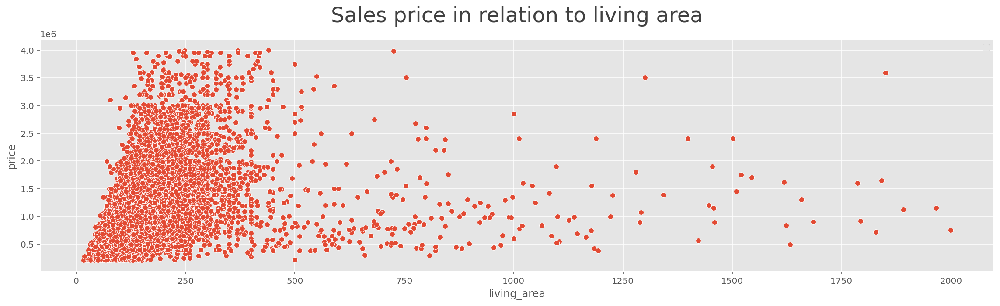

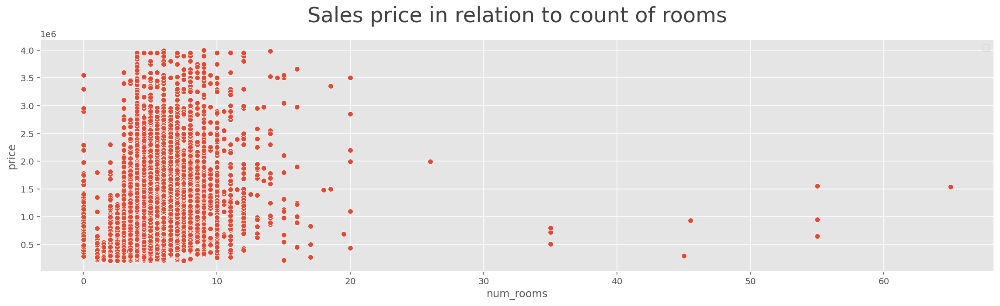

In [35]:
plt.figure(figsize=(16,5))
sns.scatterplot(data=df, x="living_area", y="price")
plt.title("Sales price in relation to living area", size=24, pad=20)
plt.legend([])
plt.tight_layout()
plt.show()

plt.figure(figsize=(16,5))
sns.scatterplot(data=df, x="num_rooms", y="price")
plt.title("Sales price in relation to count of rooms", size=24, pad=20)
plt.legend([])
plt.tight_layout()
plt.show()

## Conclusions from EDA

**The main take aways from the data exploration are:**
- We seem to have a reasonable amount of data samples at hand for the task.
- The data is easy to handle in terms of memory consumption and compute.
- The exact source, age and collection procedure of the data is unknown.
- The locations cover a wide range of places, mostly in the german speaking part as well as holiday locations like Bagnes, Tessin and Graubünden.
- The test data seem to be similar to the training data.
- Some features are linearly correlated to the target. However, there are only two features with a weak to moderate correlation.
- All numerical features are skewed and contain outliers.


**To do:**
- Fix errors in `build_year`.
- Log transform `price`.

**Options to improve modeling:**
- Remove outliers in `num_rooms` and `living_area`.
- Interpret values of 0 in `num_rooms` as missing values and impute, e.g. with median.
- Possibly replace value «Sonstige» with most common type.
- Engineer new features. 
- Add additional data, e.g. from geographical location. 